In [1]:
from keras.models import Sequential
from keras.layers.core import Flatten, Dense, Dropout
from keras.layers import Activation, UpSampling2D,Reshape, Input
from keras.layers.convolutional import Conv2D, MaxPooling2D, ZeroPadding2D, Conv2DTranspose
from keras.optimizers import SGD
from keras.models import Model
import cv2, numpy as np
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches


#from keras.applications.vgg16 import VGG16

Using Theano backend.


Populating the interactive namespace from numpy and matplotlib


In [2032]:
%pylab inline
from IPython.core.display import HTML
HTML("<style>.container { width:100% !important; }</style>")

Populating the interactive namespace from numpy and matplotlib


/home/matefejes/anaconda2/envs/deeplearn2_env/lib/python2.7/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['test']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


# Recreating original VGG_16 model

In [1539]:
model = Sequential()

model.add(Conv2D(64, (3, 3), padding='same', activation='relu', name='conv1', input_shape=(224,224,3)))
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', name='conv2'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(Conv2D(128, (3, 3), padding='same', activation='relu', name='conv3'))
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', name='conv4'))
model.add(MaxPooling2D((2,2), strides=(2,2)))


model.add(Conv2D(256, (3, 3), padding='same', activation='relu', name='conv5'))
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', name='conv6'))
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', name='conv7'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(Conv2D(512, (3, 3), padding='same', activation='relu', name='conv8'))
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', name='conv9'))
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', name='conv10'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(Conv2D(512, (3, 3), padding='same', activation='relu', name='conv11'))
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', name='conv12'))
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', name='conv13'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(Flatten())
model.add(Dense(4096, activation='relu', name='dense1'))
#model.add(Dropout(0.5)) #doesn't do anything when classifying
model.add(Dense(4096, activation='relu', name='dense2'))
#model.add(Dropout(0.5)) 
#   model.add(Dense(1000, activation='softmax', name='dense3'))
model.add(Dense(1000, name='dense3')) #more easily inverted without softmax activation, 
#and doesn't influence accuracy (can be normalized later if required)

model.load_weights('/mnt/idms/home/matefejes/convnet_visualization/vgg16_weights_tf_dim_ordering_tf_kernels.h5')


In [1540]:
#model = VGG_16('/mnt/idms/home/matefejes/convnet_visualization/vgg16_weights_tf_dim_ordering_tf_kernels.h5')
sgd = SGD(lr=0.1, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer=sgd, loss='categorical_crossentropy')

In [1541]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1 (Conv2D)               (None, 224, 224, 64)      1792      
_________________________________________________________________
conv2 (Conv2D)               (None, 224, 224, 64)      36928     
_________________________________________________________________
max_pooling2d_46 (MaxPooling (None, 112, 112, 64)      0         
_________________________________________________________________
conv3 (Conv2D)               (None, 112, 112, 128)     73856     
_________________________________________________________________
conv4 (Conv2D)               (None, 112, 112, 128)     147584    
_________________________________________________________________
max_pooling2d_47 (MaxPooling (None, 56, 56, 128)       0         
_________________________________________________________________
conv5 (Conv2D)               (None, 56, 56, 256)       295168    
__________

In [1542]:
model_weights=model.get_weights()

In [1986]:
inv_model_weights=inv_model.get_weights()

In [29]:
#string labels for classes
str_label = []
with open('/mnt/idms/home/matefejes/convnet_visualization/str_labels.txt','r') as inf:
    str_label = eval(inf.read())

class_numb=len(str_label)

# loading test pictures

In [94]:
import glob
ims_v = []
ims=[]
for img in glob.glob("/mnt/idms/home/matefejes/convnet_visualization/test_images/*.jpg"):

    n= cv2.resize(cv2.imread(img), (224, 224))
    ims.append(n)
ims=np.stack(ims)


## testing classification

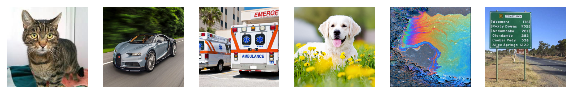

In [963]:
leng=len(ims)
fig,ax=plt.subplots(1,leng,figsize=(10,3))
for i in range(leng):
    ax[i].imshow(cv2.cvtColor(ims[i,:,:,:], cv2.COLOR_BGR2RGB))
    ax[i].set_frame_on(False)
    ax[i].set_xticks([])
    ax[i].set_yticks([])


In [2072]:
#printing best guess, and confidence
out = model.predict(ims)
for i in range(len(out)):
    print str_label[out.argmax(axis=1)[i]],out.max(axis=1)[i]

tabby, tabby cat 0.718177
sports car, sport car 0.731284
ambulance 0.930722
cabbage butterfly 0.530692
jigsaw puzzle 0.790609
street sign 0.81552


In [82]:
best_guess=[]
top=out.argsort(axis=1,)[:,-3:]
for i in top:
    best_guess.append([str_label[l] for l in i])

In [83]:
best_guess

[['tiger cat', 'Egyptian cat', 'tabby, tabby cat'],
 ['racer, race car, racing car', 'convertible', 'sports car, sport car'],
 ['tow truck, tow car, wrecker',
  'gas pump, gasoline pump, petrol pump, island dispenser',
  'ambulance'],
 ['Boston bull, Boston terrier', 'pug, pug-dog', 'cabbage butterfly'],
 ['maze, labyrinth', 'prayer rug, prayer mat', 'jigsaw puzzle'],
 ['flagpole, flagstaff', 'scoreboard', 'street sign']]

# Building Inverse model

In [1920]:
inp_s=(class_numb,)
inv_model = Sequential()



inv_model.add(Dense(4096, activation='relu',name='dense3',input_shape=inp_s))
inv_model.add(Dense(4096, activation='relu',name='dense2'))
inv_model.add(Dense(25088 ,name='dense1'))

inv_model.add(Reshape((7,7,512)))

inv_model.add(UpSampling2D(size=(2, 2),name='pool5'))
inv_model.add(Activation('relu'))
inv_model.add(Conv2DTranspose(512, (3, 3), padding='same', activation='relu', name='conv13'))
inv_model.add(Conv2DTranspose(512, (3, 3), padding='same', activation='relu', name='conv12'))
inv_model.add(Conv2DTranspose(512, (3, 3), padding='same', name='conv11'))

inv_model.add(UpSampling2D(size=(2, 2),name='pool4'))
inv_model.add(Activation('relu'))
inv_model.add(Conv2DTranspose(512, (3, 3), padding='same', activation='relu', name='conv10'))
inv_model.add(Conv2DTranspose(512, (3, 3), padding='same', activation='relu', name='conv9'))
inv_model.add(Conv2DTranspose(256, (3, 3), padding='same', name='conv8'))

inv_model.add(UpSampling2D(size=(2, 2),name='pool3'))
inv_model.add(Activation('relu'))
inv_model.add(Conv2DTranspose(256, (3, 3), padding='same', activation='relu', name='conv7'))
inv_model.add(Conv2DTranspose(256, (3, 3), padding='same', activation='relu', name='conv6'))
inv_model.add(Conv2DTranspose(128, (3, 3), padding='same', name='conv5'))

inv_model.add(UpSampling2D(size=(2, 2),name='pool2'))
inv_model.add(Activation('relu'))
inv_model.add(Conv2DTranspose(128, (3, 3), padding='same', activation='relu', name='conv4',input_shape=( 112, 112, 128)))
inv_model.add(Conv2DTranspose(64, (3, 3), padding='same', name='conv3'))

inv_model.add(UpSampling2D(size=(2, 2),name='pool1'))
inv_model.add(Activation('relu'))
inv_model.add(Conv2DTranspose(64, (3, 3), padding='same', activation='relu', name='conv2'))
inv_model.add(Conv2DTranspose(3, (3, 3), padding='same', name='conv1'))



inv_w_r=inv_model.get_weights()
inv_layer_count=len(inv_w_r) #double of number of convolutional layers in inverse model (just for TESTING)

In [1544]:
inv_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense3 (Dense)               (None, 4096)              4100096   
_________________________________________________________________
dense2 (Dense)               (None, 4096)              16781312  
_________________________________________________________________
dense1 (Dense)               (None, 25088)             102785536 
_________________________________________________________________
reshape_29 (Reshape)         (None, 7, 7, 512)         0         
_________________________________________________________________
pool5 (UpSampling2D)         (None, 14, 14, 512)       0         
_________________________________________________________________
activation_112 (Activation)  (None, 14, 14, 512)       0         
_________________________________________________________________
conv13 (Conv2DTranspose)     (None, 14, 14, 512)       2359808   
__________

## calculating and setting weights for inverse model from real weights

### for convolution layers

In [1930]:
#i=1
for i in range(1,14,1): #conv layers 1,2...13
    wf=model.get_layer('conv'+str(i)).get_weights()
    wi=wf #no need for transposing weights, because of transpose conv layer
    wi[1]=np.dot(wf[0].sum(axis=(0,1)),wf[1])#[:,0]  #inverse offset weights
    wi[1]=np.zeros(wi[1].shape) #if we want 0 bias in the inverse model
    
    inv_model.get_layer('conv'+str(i)).set_weights(wi)
    
#     print shape(wi[0])
#     print shape(wi[1])


### for dense layers

In [1931]:
#i=1
for i in range(1,4,1): #dense layers 1,2,3
    wf=model.get_layer('dense'+str(i)).get_weights()
    wi=wf
    wi[0]=wf[0].transpose()
    wi[1]=np.dot(wf[0].transpose(),np.expand_dims(wf[1], axis=0).transpose())[:,0] #inverse offset weights
    wi[1]=np.zeros(wi[1].shape) #if we want 0 bias in the inverse model
    
    inv_model.get_layer('dense'+str(i)).set_weights(wi)
    
#     print shape(wi[0])
#     print shape(wi[1])


In [1932]:
#inv_model.set_weights(inv_w[-inv_layer_count:])

sgd = SGD(lr=0.1, decay=1e-6, momentum=0.9, nesterov=True)
inv_model.compile(optimizer=sgd, loss='categorical_crossentropy')
inv_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense3 (Dense)               (None, 4096)              4100096   
_________________________________________________________________
dense2 (Dense)               (None, 4096)              16781312  
_________________________________________________________________
dense1 (Dense)               (None, 25088)             102785536 
_________________________________________________________________
reshape_32 (Reshape)         (None, 7, 7, 512)         0         
_________________________________________________________________
pool5 (UpSampling2D)         (None, 14, 14, 512)       0         
_________________________________________________________________
activation_122 (Activation)  (None, 14, 14, 512)       0         
_________________________________________________________________
conv13 (Conv2DTranspose)     (None, 14, 14, 512)       2359808   
__________

## creating dicts layer name<->sequence number

In [1525]:
vis_layer='conv5'

In [1524]:
conv_names=['conv'+str(i) for i in range(1,14,1)]

In [1310]:
# creating dicts for layer name <-> layer sequence number
seq2name={}
for i in range(22): #number of layers=22
    seq2name[i]=model.layers[i].get_config()['name']
name2seq = {v: k for k, v in seq2name.iteritems()}

In [1311]:
# creating dicts for inv layer name <-> inv layer sequence number
iseq2iname={}
for i in range(27): #number of inv layers=27
    iseq2iname[i]=inv_model.layers[i].get_config()['name']
iname2iseq = {v: k for k, v in iseq2iname.iteritems()}

In [ ]:
conv_names=['conv'+str(i) for i in range(1,14,1)]

# restoring original picture based on feature maps in certain layers

In [2016]:
def set_input_weights(inverse_part_model):
    #creating layer weights, that dont change anything when used (unclean solution for not being able to input data any other way to inverse sub model)
    ew_o=inverse_part_model.get_layer('just4input').get_weights()
    ew0=np.zeros(ew_o[0].shape)
    for i in range(ew_o[0].shape[-1]): #iterating over every kernel
        ew0[1,1,i,i]=1 #kernels, that recreate the original feature maps
    ew1=np.zeros(ew_o[1].shape)
    inverse_part_model.get_layer('just4input').set_weights((ew0,ew1))
    return inverse_part_model

In [2017]:
def create_sub_inv_model(vis_layer,intermediate_output):
    #inverse sub-model: the part of the invers model between the examined layer and the output
    inv_sub_model = Sequential()
    # inv_sub_model.add(Input(shape=intermediate_output.shape[1:]))
    chnumb=intermediate_output.shape[-1]
    inv_sub_model.add(Conv2D(chnumb, (3, 3), padding='same', name='just4input',input_shape=intermediate_output.shape[1:]))
    for layer in inv_model.layers[iname2iseq[vis_layer]:]:
        inv_sub_model.add(layer)
     
    return set_input_weights(inv_sub_model)
    

In [2083]:
def restore_from_layer(vis_layer):
    #forward sub-model: the part of the VGG_16 model between the input and the examined layer
    sub_model = Model(inputs=model.input,
                                     #outputs=model.layers[21].output)
                      outputs=model.get_layer(vis_layer).output)
    #                  outputs=model.layer[20].output)
    intermediate_output = sub_model.predict(ims)

    inv_sub_model=create_sub_inv_model(vis_layer,intermediate_output)

    pred=inv_sub_model.predict(intermediate_output)
    return norm_rgb(pred)

In [1531]:
#normalize globally
def norm_rgb(rest_imgs):
    normed=np.zeros(rest_imgs.shape)
    
    for p in range(rest_imgs.shape[0]):
        mins=rest_imgs[p,:,:,:].min()
        maxs=rest_imgs[p,:,:,:].max()
        normed[p,:,:,:]=(rest_imgs[p,:,:,:]-mins)/(maxs-mins)
        
    return normed
    

In [2084]:
# restoring images from every convolution layer with the inverse sub-models
conv_numb=len(conv_names)
all_conv_rest=np.zeros([conv_numb]+(list(ims.shape)))
for i in range(conv_numb):
    all_conv_rest[i,:,:,:,:]=restore_from_layer(conv_names[i])
    

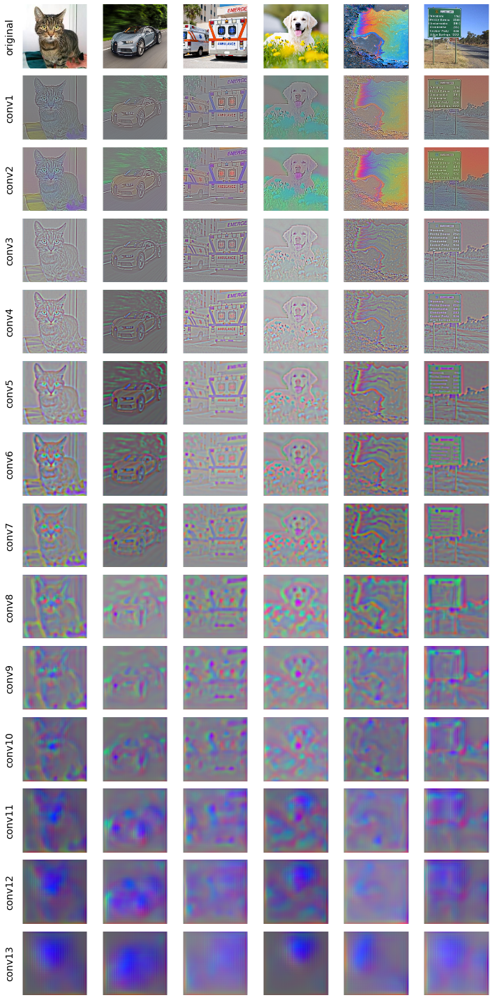

In [2087]:
leng=len(ims)
fig,ax=plt.subplots(len(conv_names)+1,leng,figsize=(10,20),sharey=True)
for j in range(leng):

    ax[0,j].imshow(cv2.cvtColor(ims[j,:,:,:], cv2.COLOR_BGR2RGB))
    
    
    ax[0,j].set_frame_on(False)
    ax[0,j].set_xticks([])
    ax[0,j].set_yticks([])

    if j==0:
        ax[0,j].set_ylabel('original', fontsize=14)
    
for i in range(conv_numb):
    for j in range(leng):
        
        ax[i+1,j].imshow(all_conv_rest[i,j,:,:,:])
        ax[i+1,j].set_frame_on(False)
        ax[i+1,j].set_xticks([])
        ax[i+1,j].set_yticks([])
        
        if j==0:
            ax[i+1,j].set_ylabel(conv_names[i], fontsize=14)
#     ax[i].imshow(cv2.cvtColor(ims_v[i,:,:,:], cv2.COLOR_BGR2RGB))
plt.tight_layout()
#plt.savefig('/mnt/idms/home/matefejes/convnet_visualization/figs/reconstruct_from_layer_gn_bs',dpi=300)


# Visualization of kernels with deconvolving neuron activations

In [1694]:
def getBoundingBox(x,y,layer_name): 
#calculating reception field of given neuron in given layer

    xmin=x
    xmax=x
    ymin=y
    ymax=y
    gmin=0
    gmax=243

    c=3 #size of every conv kernel
    k=2 #max_pooling parameter

    sl=iname2iseq[layer_name]
    el=26
    for ln in range(sl,el+1):

        if iseq2iname[ln].startswith('conv'):
            bg=(c-1)/2 #size of border growth
            xmin-=bg
            xmax+=bg
            ymin-=bg
            ymax+=bg
        elif iseq2iname[ln].startswith('pool'):
            xmin=xmin*k
            xmax=(xmax+1)*k-1
            ymin=ymin*k
            ymax=(ymax+1)*k-1

        #compare with border params
    xmin=int(max(xmin,gmin))
    xmax=int(min(xmax,gmax))
    ymin=int(max(ymin,gmin))
    ymax=int(min(ymax,gmax))
    return xmin,xmax,ymin,ymax

In [1108]:
def norm_rgb_sing(v):
    mins=v[:,:,:].min(axis=(0,1))
    maxs=v[:,:,:].max(axis=(0,1))
    normed=(v[:,:,:]-mins)/(maxs-mins)
    return normed

In [1370]:
def norm_rgb_glob(v): 
#normalize values of rgb images    
    mins=v.min()
    maxs=v.max()
    normed=(v-mins)/(maxs-mins)
    return normed

In [2088]:
def visual_layer(vis_layer,picnumb=5,kernNumb=5,neurNumb=3):

    # vis_layer='conv7'
    # picnumb=5
    # kernNumb=8 #number of kernels per layer to check out
    # neurNumb=3 #number of examples in picture for neuron activation

    #img=ims[picnumb,:,:,:]

    ######################### forward sub-model: the part of the VGG_16 model between the input and the examined layer ##############################################
    sub_model = Model(inputs=model.input,
                      outputs=model.get_layer(vis_layer).output)

    intermediate_output = sub_model.predict(np.expand_dims(ims[picnumb,:,:,:], axis=0))

    inv_sub_model=create_sub_inv_model(vis_layer,intermediate_output)

    ######################### finding indexes of displayable neurons ##############################################

    a=intermediate_output[0,:,:,:]
    kernels=a.max(axis=(0,1)).argsort()[-kernNumb:]

    neur_indexes_for_layer=[]
    kseq=0

    inputarr=np.zeros(tuple([kernNumb]+list(intermediate_output.shape[1:]))) #input for neurons in 1 kernel
    kernelvis_input=np.zeros(tuple([kernNumb]+list(intermediate_output.shape[1:])))

    for k in kernels:
        a_1d=a[:,:,k].flatten()
        idx_1d = a_1d.argsort()[-neurNumb:]
        x_idx, y_idx = np.unravel_index(idx_1d, a[:,:,k].shape) #get x,y coords of max intensity neurons
        ins=np.vstack((x_idx,y_idx,np.ones(x_idx.shape)*k)) #stacking x,y,z index values
        neur_indexes_for_layer.append(np.transpose(ins))

    #     print kseq
        inputarr[kseq,7,7,k]=1.0   #coordinates (7,7) arbitrarily chosen, to be in the middle
        kernelvis_input[kseq,:,:,k]=intermediate_output[0,:,:,k]
        kseq+=1


    preds=inv_sub_model.predict(inputarr)
    kernelvis_preds=inv_sub_model.predict(kernelvis_input)

    ######################### Bounding boxes for every neuron in every feature map ##############################################

    xmax=np.zeros((kernNumb,neurNumb+1),dtype=int)
    xmin=np.zeros((kernNumb,neurNumb+1),dtype=int)
    ymax=np.zeros((kernNumb,neurNumb+1),dtype=int)
    ymin=np.zeros((kernNumb,neurNumb+1),dtype=int)
    for kseq in range(kernNumb):
        for n in range(neurNumb):
            [x,y]=neur_indexes_for_layer[kseq][n][0:2].astype(int)
            xmin[kseq,n],xmax[kseq,n],ymin[kseq,n],ymax[kseq,n]=getBoundingBox(x,y,vis_layer)
        xmin[kseq,neurNumb],xmax[kseq,neurNumb],ymin[kseq,neurNumb],ymax[kseq,neurNumb]=getBoundingBox(7,7,vis_layer)


#.imshow(cv2.cvtColor(, cv2.COLOR_BGR2RGB))
    ######################### plotting ##############################################

    fig,ax=plt.subplots(kernNumb,neurNumb+4,figsize=(12+neurNumb*3,3*kernNumb)) # one rectangle side=3

    ax[0,0].set_xlabel('one neurons\nreceptive field', fontsize=16)
    ax[0,1].set_xlabel('feature map\nvalues', fontsize=16)
    ax[0,2].set_xlabel('deconvolved from\n feature map', fontsize=16)
    ax[0,3].set_xlabel('locations of\ntop activations', fontsize=16)


    for kseq in range(kernNumb):
        kern=int(neur_indexes_for_layer[kseq][0][-1])
    #     cv2.cvtColor(norm_rgb_glob(preds[kseq,xmin[kseq,neurNumb]:xmax[kseq,neurNumb],ymin[kseq,neurNumb]:ymax[kseq,neurNumb],:]))
        ax[kseq,0].imshow(cv2.cvtColor(norm_rgb_glob(preds[kseq,xmin[kseq,neurNumb]:xmax[kseq,neurNumb],ymin[kseq,neurNumb]:ymax[kseq,neurNumb],:]), cv2.COLOR_BGR2RGB))

#         ax[kseq,0].imshow(norm_rgb_glob(preds[kseq,xmin[kseq,neurNumb]:xmax[kseq,neurNumb],ymin[kseq,neurNumb]:ymax[kseq,neurNumb],:]))
        ax[kseq,1].imshow(intermediate_output[0,:,:,kern])

#         ax[kseq,2].imshow(norm_rgb_glob(kernelvis_preds[kseq,:,:,:]))
        ax[kseq,2].imshow(cv2.cvtColor(norm_rgb_glob(kernelvis_preds[kseq,:,:,:]), cv2.COLOR_BGR2RGB))
        ax[kseq,3].imshow(cv2.cvtColor(ims[picnumb,:,::], cv2.COLOR_BGR2RGB))
        for n in range(neurNumb):

            rect = patches.Rectangle((ymin[kseq,n],xmin[kseq,n]),xmax[kseq,n]-xmin[kseq,n],ymax[kseq,n]-ymin[kseq,n],linewidth=1,edgecolor='r',facecolor='none') #plot bounding boxes
            # Add the patch to the Axes
            ax[kseq,3].add_patch(rect)

            ax[kseq,n+4].imshow(cv2.cvtColor(ims[picnumb,xmin[kseq,n]:xmax[kseq,n],ymin[kseq,n]:ymax[kseq,n],:], cv2.COLOR_BGR2RGB))
            if kseq==0:
                 ax[kseq,n+4].set_xlabel('top '+str(n)+'\nactivation', fontsize=16)
        for n in range(neurNumb+4):
            ax[kseq,n].set_xticks([])
            ax[kseq,n].set_yticks([])
            ax[kseq,n].xaxis.set_label_position('top')
            ax[kseq,n].set_frame_on(False)

            if n==0:
                ax[kseq,n].set_ylabel('feature map '+str(kern), fontsize=16)

    plt.tight_layout()
    figname='vis_layer_'+vis_layer+'_image_'+str(picnumb)+'_n'+str(neurNumb)+'k'+str(kernNumb)+'.png'
    plt.savefig('/mnt/idms/home/matefejes/convnet_visualization/figs/'+figname,dpi=300)

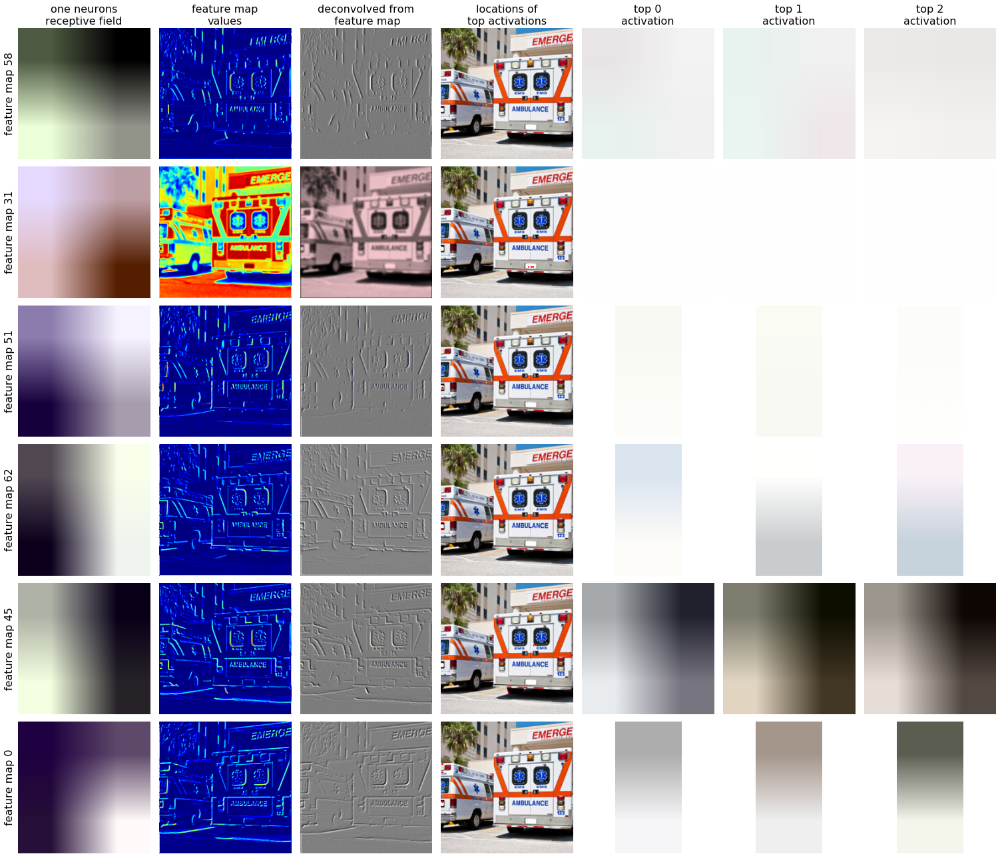

In [2090]:
visual_layer('conv1',picnumb=2,kernNumb=6,neurNumb=3)

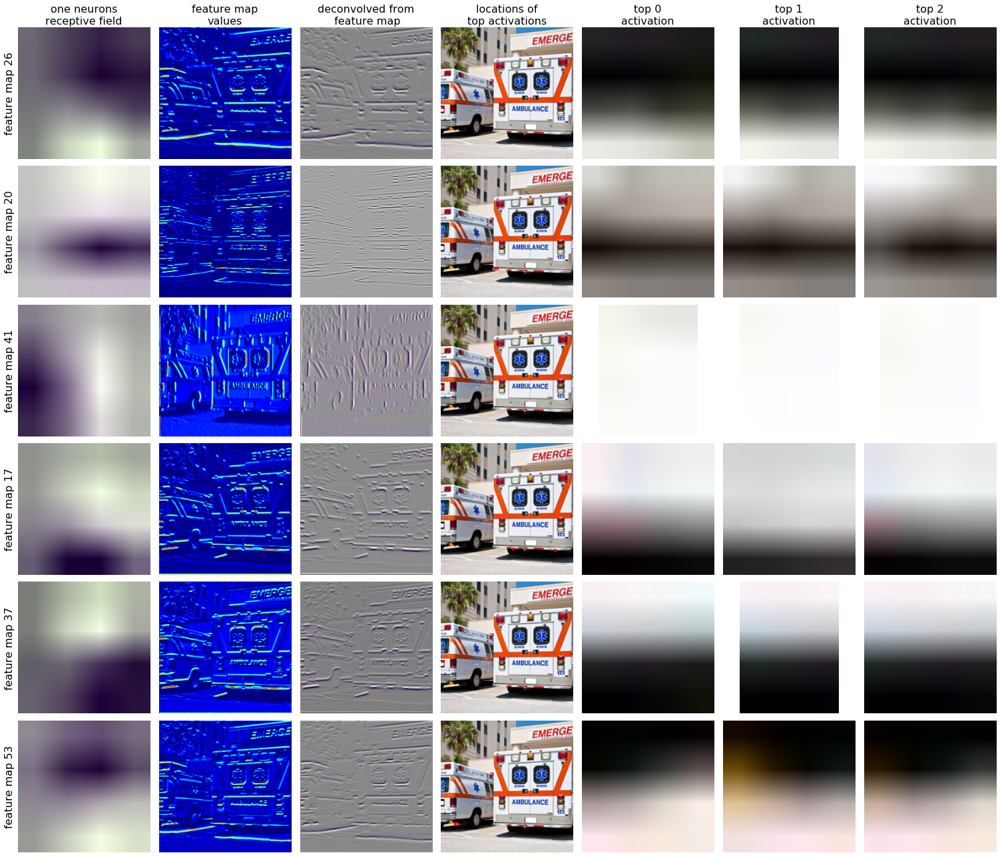

In [2091]:
visual_layer('conv2',picnumb=2,kernNumb=6,neurNumb=3)

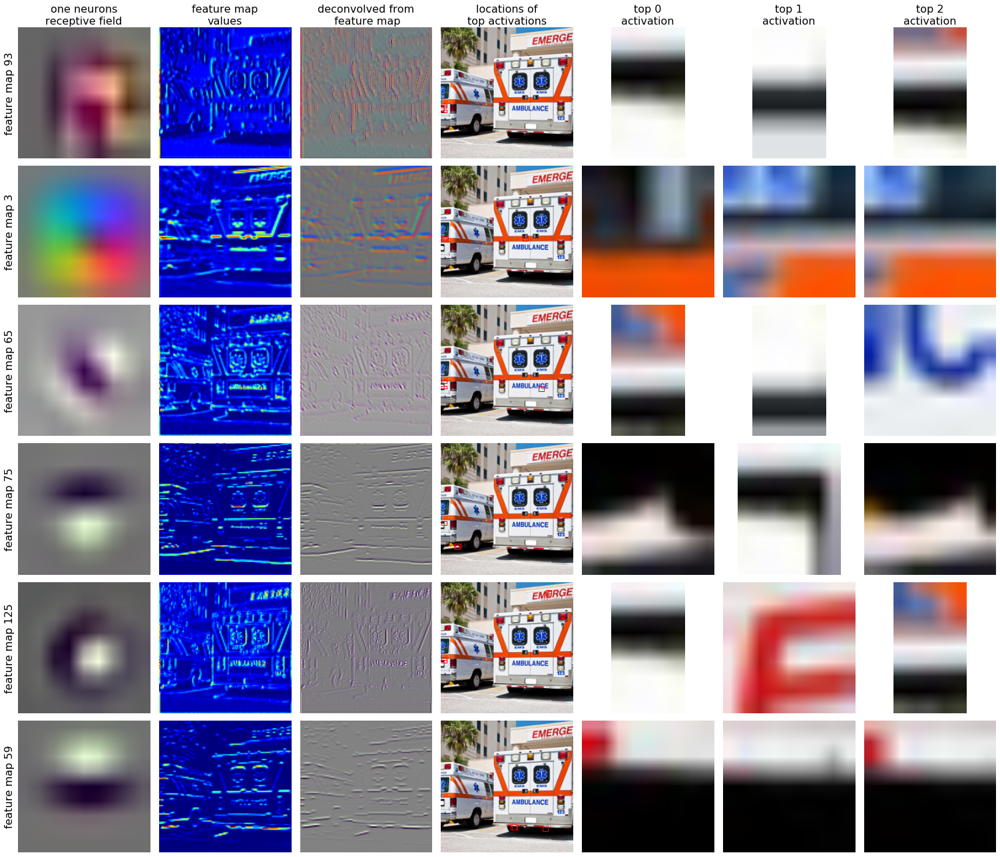

In [2092]:
visual_layer('conv3',picnumb=2,kernNumb=6,neurNumb=3)

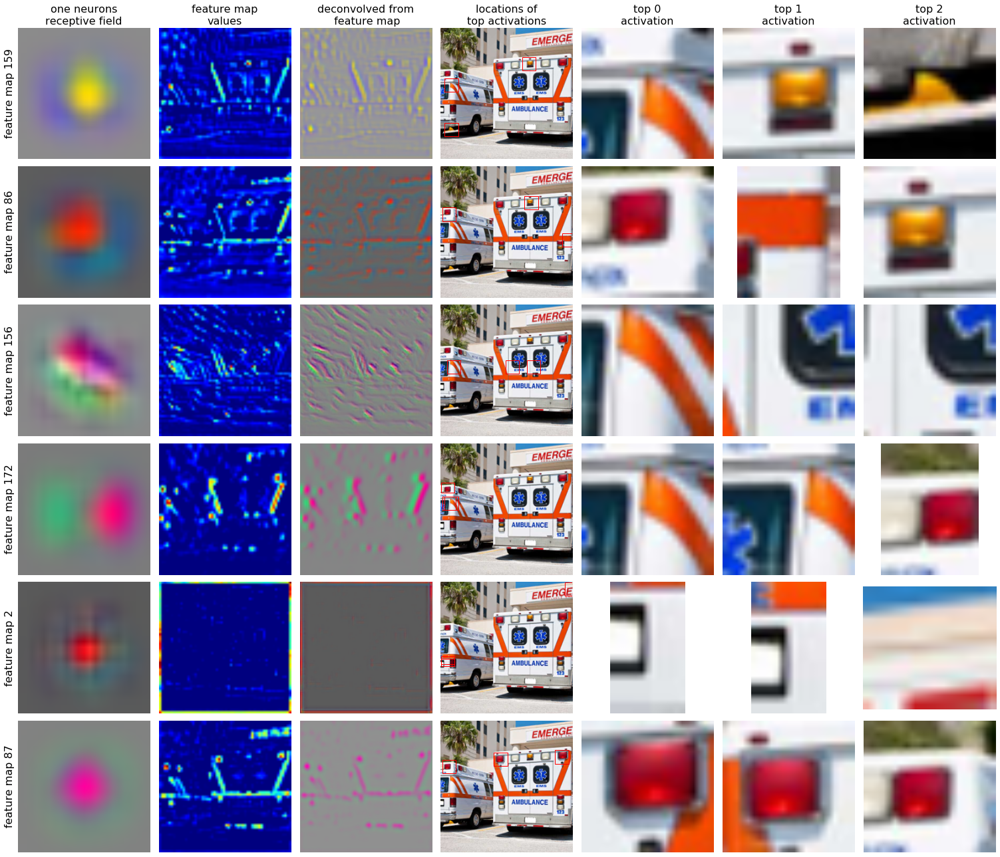

In [2093]:
visual_layer('conv5',picnumb=2,kernNumb=6,neurNumb=3)

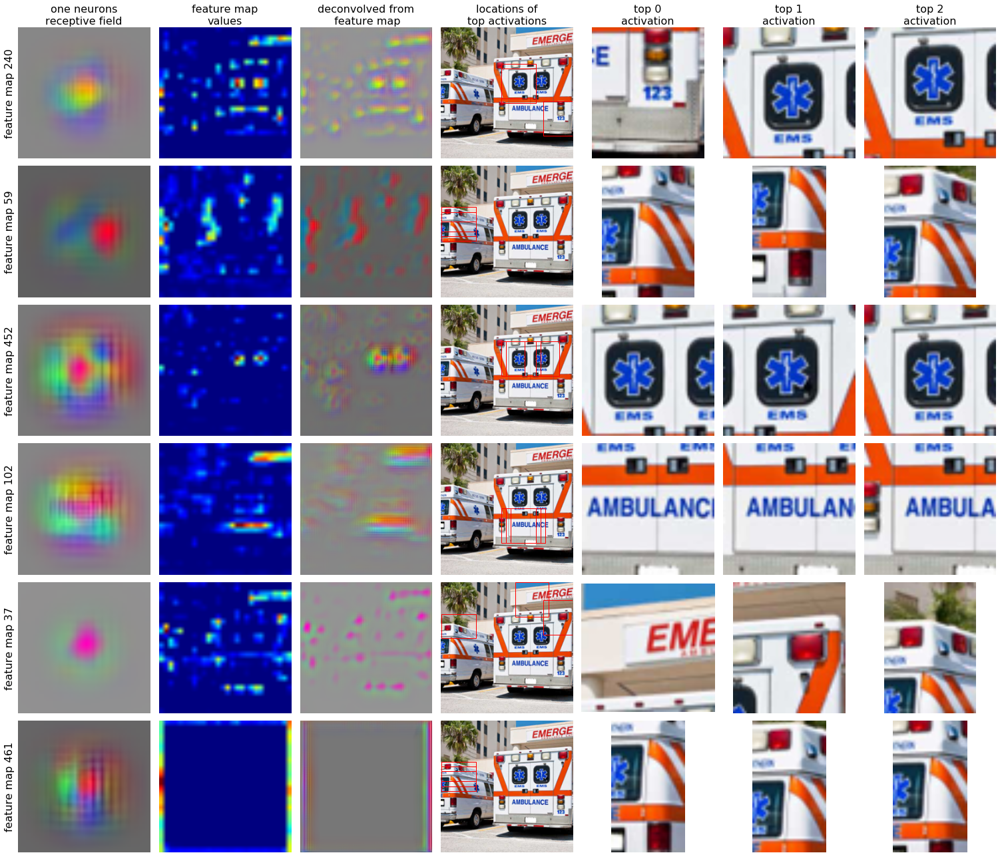

In [2094]:
visual_layer('conv8',picnumb=2,kernNumb=6,neurNumb=3)

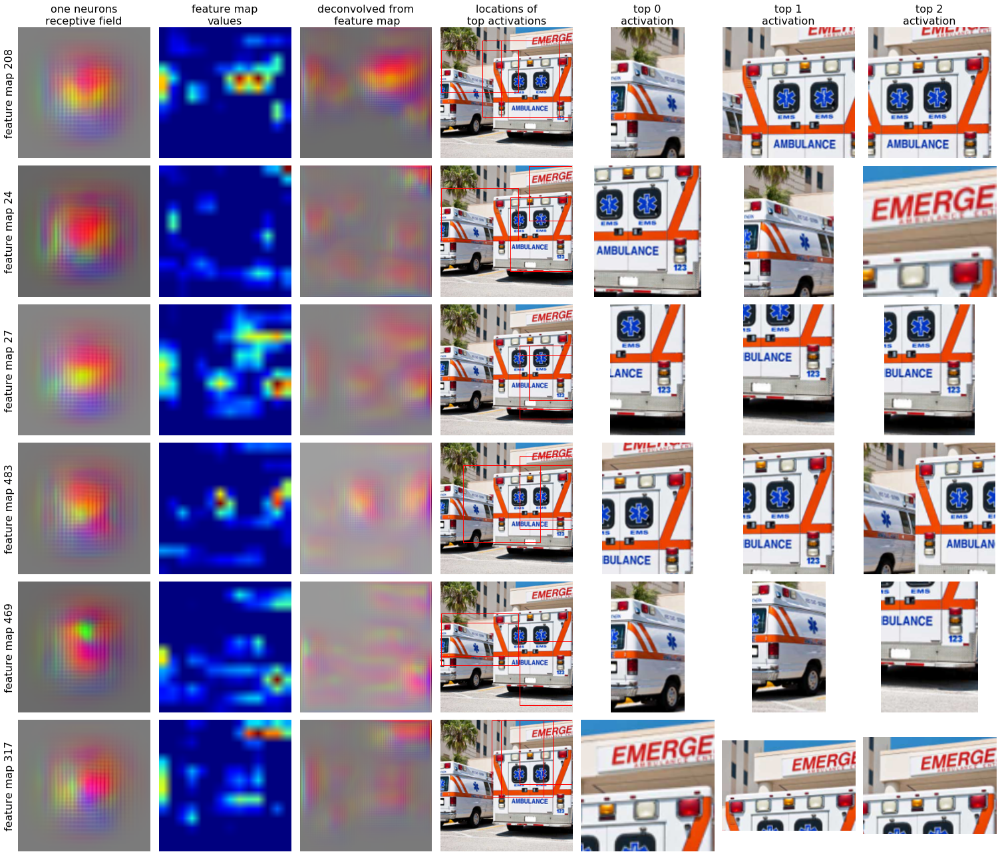

In [2095]:
visual_layer('conv11',picnumb=2,kernNumb=6,neurNumb=3)